In [1]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import json

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from tqdm import tqdm
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')
sns.set(context='notebook', style='darkgrid', palette='deep', font='sans-serif', font_scale=1, color_codes=False, rc=None)

In [2]:
client_id = '1bc9961c006f4254a4b0e5fa1ad4a159'
client_secret = '2294524c8d0247ceb4b5e7f062618901'
client_credentials_manager = SpotifyClientCredentials(client_id=client_id,client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)
playlists = sp.user_playlists('spotify')
spotify_playlist_ids = []
while playlists:
    for i, playlist in enumerate(playlists['items']):
        spotify_playlist_ids.append(playlist['uri'][-22:])
    if playlists['next']:
        playlists = sp.next(playlists)
    else:
        playlists = None

In [3]:
playlists = [
                {'uri': 'spotify:user:TEST:playlist:37i9dQZF1DWYfvJNWU1bKi'}
            ]
playlist_uri = playlists[0]['uri']
uri = playlist_uri    # the URI is split by ':' to get the username and playlist ID
username = uri.split(':')[2]
playlist_id = uri.split(':')[4]
results = sp.user_playlist(username, playlist_id, 'tracks')
playlist_tracks_data = results['tracks']
playlist_tracks_id = []
playlist_tracks_titles = []
playlist_tracks_artists = []
playlist_tracks_first_artists = []
release_dates=[]
popularity=[]
for track in playlist_tracks_data['items']:
    playlist_tracks_id.append(track['track']['id'])
    playlist_tracks_titles.append(track['track']['name'])
    release_dates.append(track['track']['album']['release_date'])
    popularity.append(track['track']['popularity'])
    # adds a list of all artists involved in the song to the list of artists for the playlist
    artist_list = []
    for artist in track['track']['artists']:
        artist_list.append(artist['name'])
    playlist_tracks_artists.append(artist_list)
    playlist_tracks_first_artists.append(artist_list[0])
features = sp.audio_features(playlist_tracks_id)
features_df = pd.DataFrame(data=features, columns=features[0].keys())
features_df['title'] = playlist_tracks_titles
features_df['first_artist'] = playlist_tracks_first_artists
features_df['all_artists'] = playlist_tracks_artists
features_df['release_date'] =release_dates
features_df['popularity'] =popularity
#features_df = features_df.set_index('id')
features_df = features_df[['id', 'title','release_date','first_artist', 'all_artists','popularity',
                           'danceability', 'energy', 'key', 'loudness',
                           'mode', 'acousticness', 'instrumentalness',
                           'liveness', 'valence', 'tempo',
                           'duration_ms', 'time_signature']]

In [4]:
#0:80,110:164,260:300,310:340,365:390,405:418,
#420:480,505:527,550:695,720:743,760:845,880:1016,
#1035:1045,1060:1075,1095:1115,1130:1159(keep changing the values and execute)
spoty_play=spotify_playlist_ids[1130:1159]

In [5]:
for i in spoty_play:
    playlists = [
                {'uri': 'spotify:user:TEST:playlist:'+i}
                ]
    playlist_uri = playlists[0]['uri']
    uri = playlist_uri    # the URI is split by ':' to get the username and playlist ID
    username = uri.split(':')[2]
    playlist_id = uri.split(':')[4]
    results = sp.user_playlist(username, playlist_id, 'tracks')
    playlist_tracks_data = results['tracks']
    playlist_tracks_id = []
    playlist_tracks_titles = []
    playlist_tracks_artists = []
    playlist_tracks_first_artists = []
    release_dates=[]
    popularity=[]
    
    for track in playlist_tracks_data['items']:
        playlist_tracks_id.append(track['track']['id'])
        playlist_tracks_titles.append(track['track']['name'])
        release_dates.append(track['track']['album']['release_date'])
        popularity.append(track['track']['popularity']) 
    # adds a list of all artists involved in the song to the list of artists for the playlist
        artist_list = []
        for artist in track['track']['artists']:
            artist_list.append(artist['name'])
        playlist_tracks_artists.append(artist_list)
        playlist_tracks_first_artists.append(artist_list[0])
    features = sp.audio_features(playlist_tracks_id)
    features_df2 = pd.DataFrame(data=features, columns=features[0].keys())
    features_df2['title'] = playlist_tracks_titles
    features_df2['first_artist'] = playlist_tracks_first_artists
    features_df2['all_artists'] = playlist_tracks_artists
    features_df2['release_date'] =release_dates
    features_df2['popularity'] =popularity
    #features_df = features_df.set_index('id')
    features_df2 = features_df2[['id', 'title', 'release_date','first_artist', 'all_artists',
                                'popularity','danceability', 'energy', 'key', 'loudness',
                                'mode', 'acousticness', 'instrumentalness',
                                'liveness', 'valence', 'tempo',
                                'duration_ms', 'time_signature']]
    features_df=pd.concat([features_df,features_df2])

In [6]:
df=features_df.drop_duplicates(subset=['title'])
df.reset_index(inplace=True)
df.drop('index',axis=1,inplace=True)

In [7]:
Music_Data=pd.read_csv('Final_Data.csv')

In [8]:
Music_Data['release_date']=Music_Data['release_date'].apply(lambda x:x[:4])

In [9]:
Music_Data['release_date']=pd.to_numeric(Music_Data['release_date'])

In [10]:
Music_Data.dropna(inplace=True)

In [11]:
Music_Data.sort_values(by='release_date',inplace = True)

In [12]:
Music_Data.reset_index(inplace=True)
Music_Data.drop(labels=['index','Unnamed: 0'],axis=1,inplace=True)

In [13]:
Music_Data

,id,title,release_date,first_artist,all_artists,popularity,danceability,energy,key,loudness,mode,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,5tBDBrsPypLVJ9Rbpy3MNm,Mighty Mighty Man,1900,Roy Brown,['Roy Brown'],38,0.574,0.3740,0,-15.127,0,0.824000,0.000000,0.5810,0.820,106.456,143230,4
1,1GUvbwCftGCU9HTeg1DPAW,She's Fine,1908,A.C. Reed,['A.C. Reed'],37,0.501,0.4400,9,-14.466,1,0.202000,0.001450,0.1070,0.868,82.489,258227,4
2,4bdbkXLaoccDNp6lLsZWRG,Drown In My Own Tears,1908,Lacy Gibson,['Lacy Gibson'],31,0.639,0.3800,0,-16.251,1,0.426000,0.000584,0.1240,0.488,97.814,280573,1
3,2wAfHM7Whz67VFbdanhZlk,Nobody Knows You When You're Down and Out,1923,Bessie Smith,['Bessie Smith'],36,0.614,0.0423,4,-12.033,1,0.996000,0.002930,0.1830,0.211,89.822,177133,4
4,51qp3WsYjiDuBhzR7AON69,Let Your Light Shine on Me,1928,Blind Willie Johnson,['Blind Willie Johnson'],31,0.439,0.2150,7,-16.259,1,0.968000,0.000073,0.1830,0.440,165.549,188373,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33357,6jhBI8HZ1qxetz13hjL1PE,how could you do this to me? feat. Kellin Quin...,2022,Maggie Lindemann,"['Maggie Lindemann', 'Kellin Quinn']",48,0.501,0.8530,4,-6.677,0,0.012300,0.000017,0.4110,0.270,96.025,160000,4
33358,45WduJCqST7pBJPvxZ6ZgU,Sand on the Beach,2022,FIDLAR,['FIDLAR'],47,0.362,0.7130,0,-4.460,1,0.000778,0.000000,0.0856,0.424,173.833,136511,4
33359,1srdYQIXMmdqtEYsJFq8Xc,Every Guy Ever,2022,Charlotte Sands,['Charlotte Sands'],46,0.598,0.6780,0,-5.495,1,0.002940,0.000000,0.3070,0.432,94.957,159158,4
33360,28RPEcjNNGKRdbTygQ7WoH,Outta My Head,2022,State Champs,['State Champs'],52,0.480,0.9160,10,-3.901,1,0.000027,0.017900,0.1520,0.652,90.018,176247,4


In [14]:
Music_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33362 entries, 0 to 33361
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                33362 non-null  object 
 1   title             33362 non-null  object 
 2   release_date      33362 non-null  int64  
 3   first_artist      33362 non-null  object 
 4   all_artists       33362 non-null  object 
 5   popularity        33362 non-null  int64  
 6   danceability      33362 non-null  float64
 7   energy            33362 non-null  float64
 8   key               33362 non-null  int64  
 9   loudness          33362 non-null  float64
 10  mode              33362 non-null  int64  
 11  acousticness      33362 non-null  float64
 12  instrumentalness  33362 non-null  float64
 13  liveness          33362 non-null  float64
 14  valence           33362 non-null  float64
 15  tempo             33362 non-null  float64
 16  duration_ms       33362 non-null  int64 

In [15]:
Music_Data.describe()

,release_date,popularity,danceability,energy,key,loudness,mode,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,33362.000000,3.336200e+04,33362.000000
mean,2011.343744,42.487441,0.550776,0.553196,5.193214,-10.180449,0.660752,0.377980,0.206827,0.179448,0.454674,119.008272,2.287830e+05,3.889245
std,14.238933,21.203875,0.182918,0.281394,3.560777,6.867941,0.473461,0.365470,0.346830,0.147882,0.261326,30.137835,1.122239e+05,0.446662
min,1900.000000,0.000000,0.000000,0.000283,0.000000,-47.070000,0.000000,0.000001,0.000000,0.000000,0.000000,0.000000,5.479000e+03,0.000000
25%,2007.000000,31.000000,0.434000,0.338000,2.000000,-12.149750,0.000000,0.030900,0.000000,0.096500,0.237000,95.798250,1.742535e+05,4.000000
50%,2017.000000,45.000000,0.566000,0.594000,5.000000,-8.060500,1.000000,0.239000,0.000448,0.118000,0.437000,119.282500,2.099070e+05,4.000000
75%,2022.000000,58.000000,0.685000,0.790000,8.000000,-5.665250,1.000000,0.748000,0.281000,0.210000,0.663000,137.956750,2.536130e+05,4.000000
max,2022.000000,100.000000,0.979000,1.000000,11.000000,1.342000,1.000000,0.996000,0.992000,0.993000,0.999000,224.536000,4.170227e+06,5.000000


# EDA

In [16]:
Music_Data.shape

(33362, 18)

In [17]:
Music_Data.columns

Index(['id', 'title', 'release_date', 'first_artist', 'all_artists',
       'popularity', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'time_signature'],
      dtype='object')

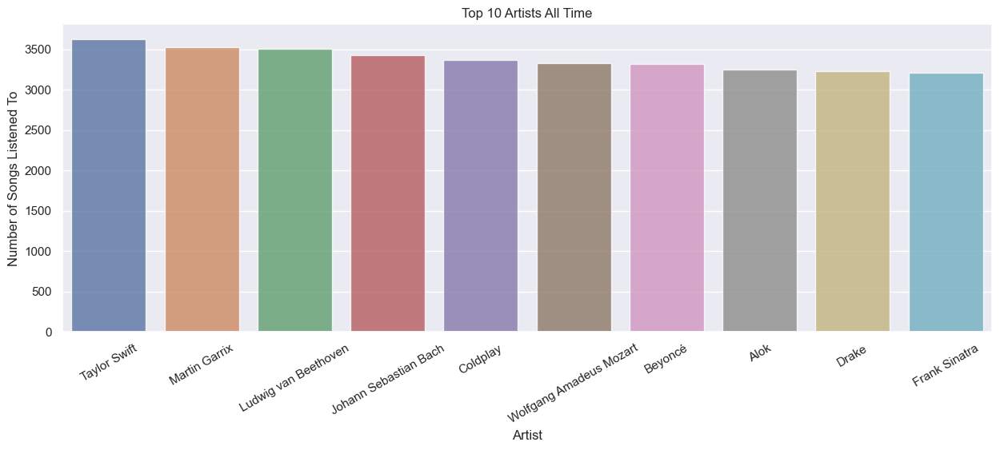

In [18]:
# who are the most popular artists of all time?
song_count =Music_Data.groupby('first_artist')['popularity'].sum().sort_values(ascending=False)[:10]
plt.figure(figsize=(15,5))
chart = sns.barplot(song_count.index, song_count.values, alpha=0.8)
plt.title('Top 10 Artists All Time')
plt.ylabel('Number of Songs Listened To', fontsize=12)
plt.xlabel('Artist', fontsize=12)
xticks=chart.xaxis.get_major_ticks()
chart.set_xticklabels(song_count.index, rotation=30)

plt.show()

In [19]:
Music_Data['happiness']=''
for num in range(0,len(Music_Data['valence'])):
    if Music_Data['valence'][num] <0.5: 
        Music_Data['happiness'][num]='negative'
    elif Music_Data['valence'][num] >=0.5 and Music_Data['valence'][num] < 0.6:
        Music_Data['happiness'][num]='neutral'
    else: 
        Music_Data['happiness'][num]='positive'
Music_Data['happiness'].value_counts()

negative    19052
positive    10537
neutral      3773
Name: happiness, dtype: int64

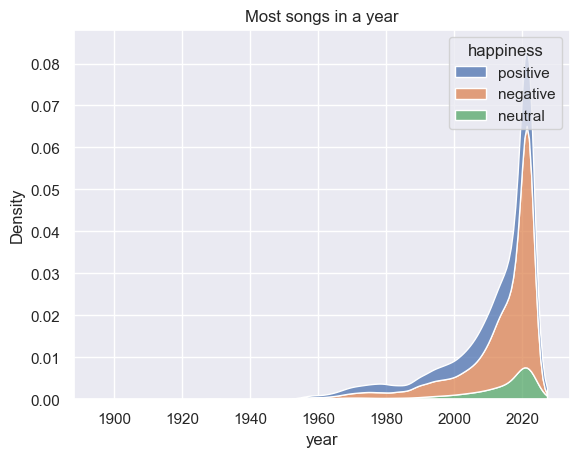

In [20]:
sns.kdeplot(x='release_date',multiple='stack',hue='happiness',data=Music_Data)
plt.title('Most songs in a year')
plt.xlabel('year', fontsize=12)
plt.show()

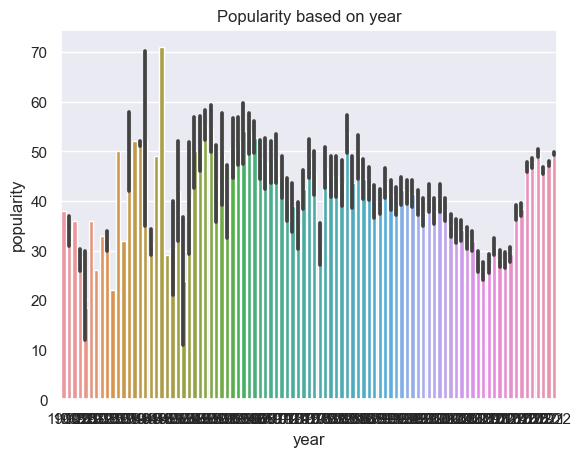

In [21]:
sns.barplot(x='release_date',y='popularity',data=Music_Data)
plt.title('Popularity based on year')
plt.ylabel('popularity', fontsize=12)
plt.xlabel('year', fontsize=12)
plt.show()

In [22]:
# Look at most popular artists by amount of time spent listening to their songs
amount_of_time = Music_Data.groupby(by='first_artist')['duration_ms'].sum().sort_values(ascending=False)[:15]

amount_of_time

first_artist
Ludwig van Beethoven        48159205
Pyotr Ilyich Tchaikovsky    37305937
Franz Schubert              33686387
Franz Liszt                 31874258
Pink Floyd                  31260383
Richard Strauss             29115944
Wolfgang Amadeus Mozart     28758657
Richard Wagner              27683003
Johannes Brahms             27220157
Béla Bartók                 23875536
Maurice Ravel               22547290
Johann Sebastian Bach       22261815
Joseph Haydn                22053692
Sergei Prokofiev            21253067
Gioachino Rossini           21075147
Name: duration_ms, dtype: int64

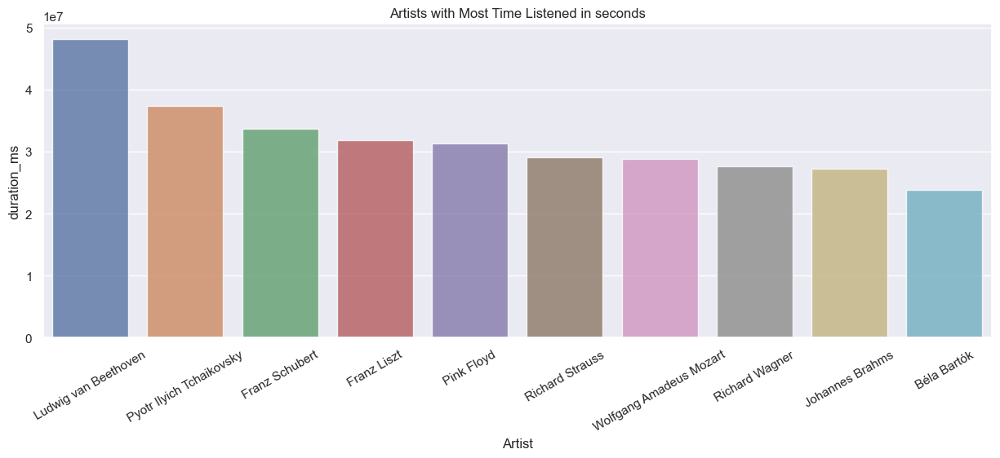

In [23]:
# What artists have the most time listened to?
b = Music_Data.groupby('first_artist')['duration_ms'].sum().sort_values(ascending=False)[:10].reset_index()
plt.figure(figsize=(15,5))
chart = sns.barplot(b['first_artist'], b['duration_ms'], alpha=0.8)
plt.title('Artists with Most Time Listened in seconds')
plt.ylabel('duration_ms', fontsize=12)
plt.xlabel('Artist', fontsize=12)
xticks=chart.xaxis.get_major_ticks()
chart.set_xticklabels(b['first_artist'], rotation=30)

plt.show()

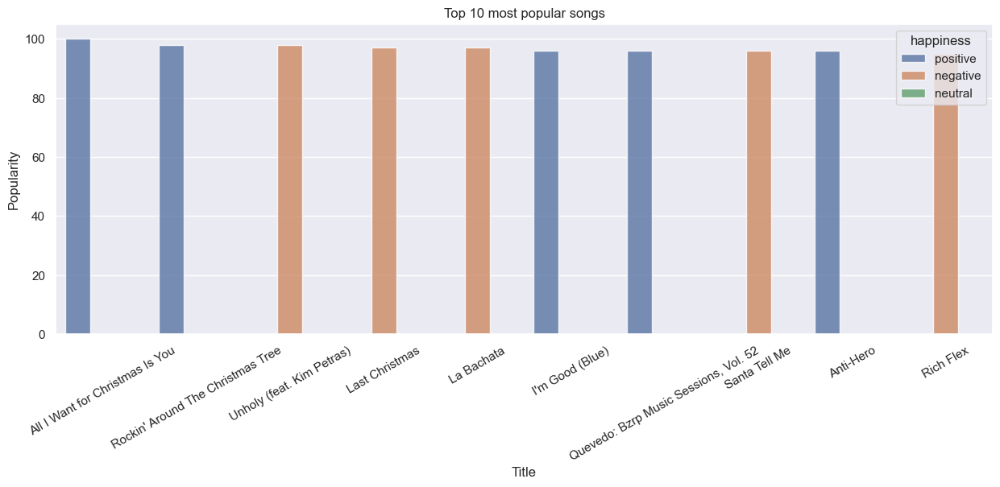

In [24]:
# What artists have the most time listened to?
b = Music_Data.groupby('title')['popularity'].sum().sort_values(ascending=False)[:10].reset_index()
plt.figure(figsize=(15,5))
chart = sns.barplot(b['title'], b['popularity'], hue= Music_Data['happiness'],alpha=0.8)
plt.title('Top 10 most popular songs')
plt.ylabel('Popularity', fontsize=12)
plt.xlabel('Title', fontsize=12)
xticks=chart.xaxis.get_major_ticks()
chart.set_xticklabels(b['title'], rotation=30)

plt.show()

In [25]:
# Creating new dateframe to analyze only audio features. 
Music = Music_Data[['danceability', 'energy', 'key', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]
af = ['danceability', 'energy', 'key', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
Music.head()

,danceability,energy,key,loudness,acousticness,instrumentalness,liveness,valence,tempo
0,0.574,0.3740,0,-15.127,0.824,0.000000,0.581,0.820,106.456
1,0.501,0.4400,9,-14.466,0.202,0.001450,0.107,0.868,82.489
2,0.639,0.3800,0,-16.251,0.426,0.000584,0.124,0.488,97.814
3,0.614,0.0423,4,-12.033,0.996,0.002930,0.183,0.211,89.822
4,0.439,0.2150,7,-16.259,0.968,0.000073,0.183,0.440,165.549


[]

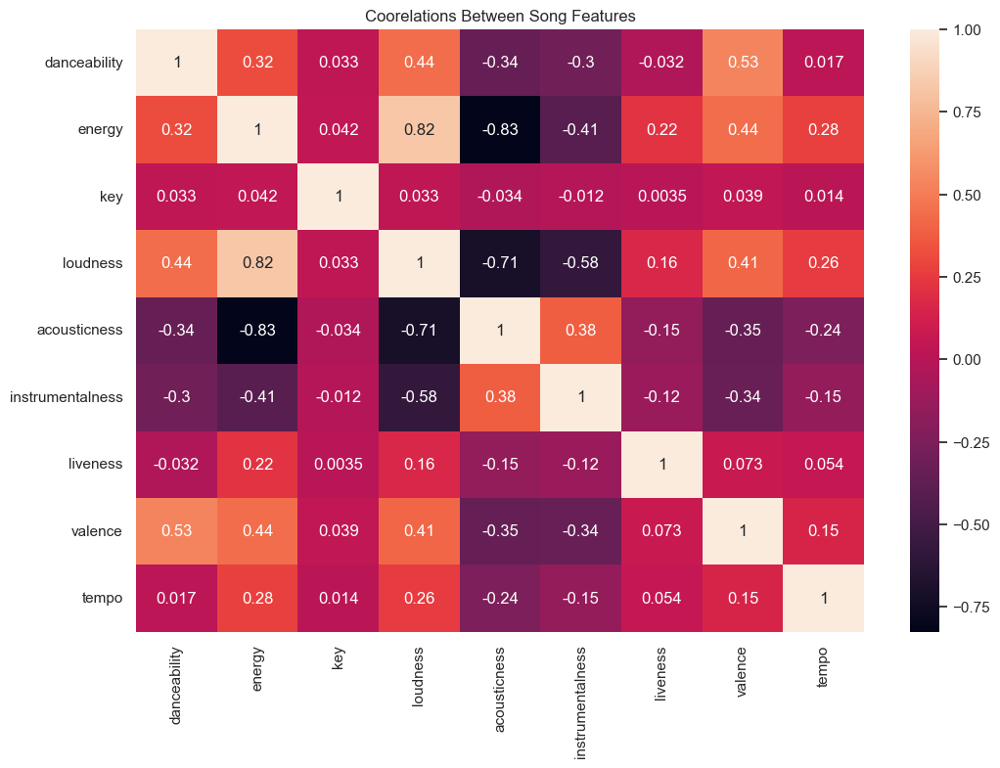

In [26]:
# Understanding how song features relate
corr = Music.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True).set(title='Coorelations Between Song Features')
plt.plot()

[]

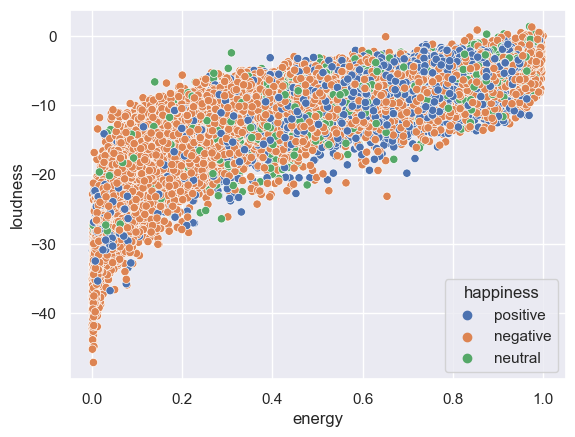

In [27]:
sns.scatterplot(x='energy',y='loudness',hue='happiness',data=Music_Data)
plt.plot()

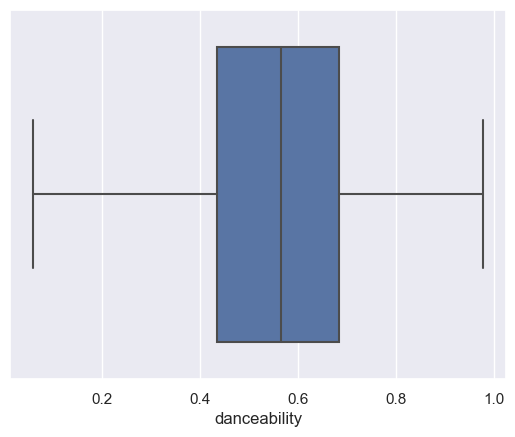

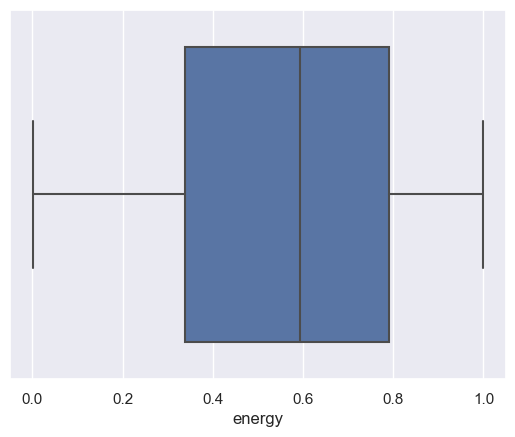

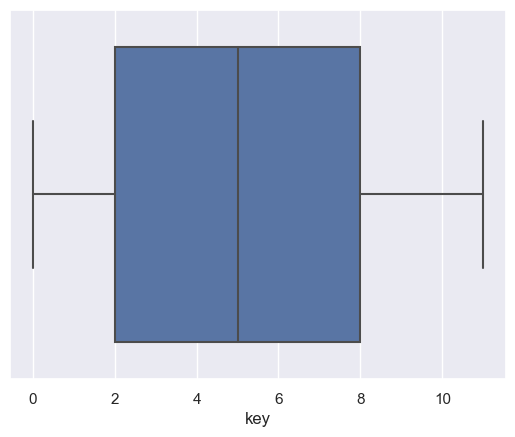

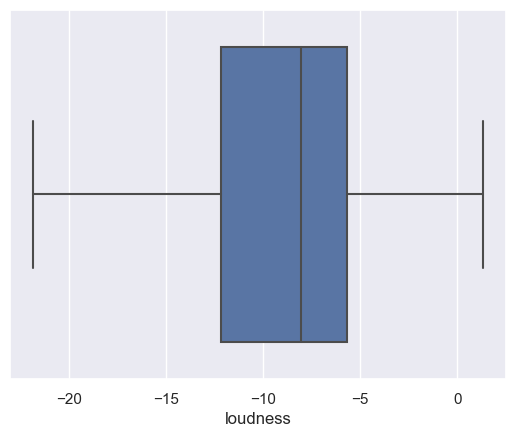

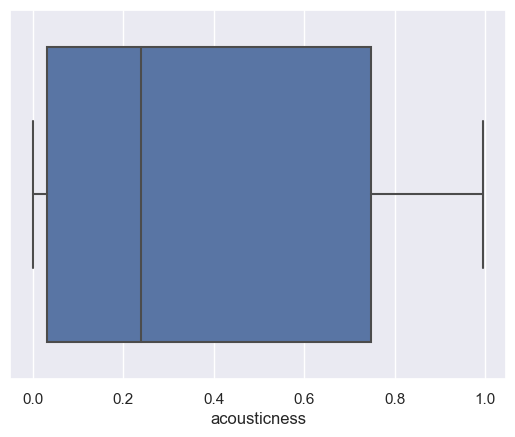

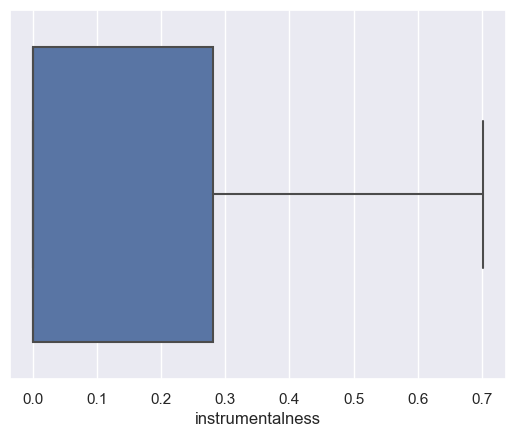

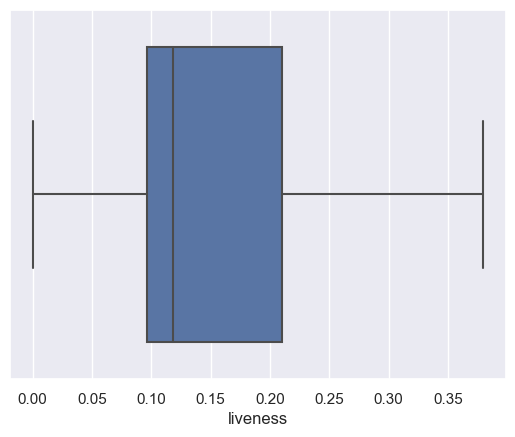

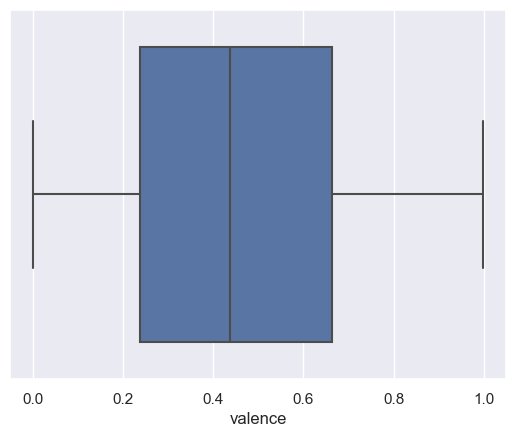

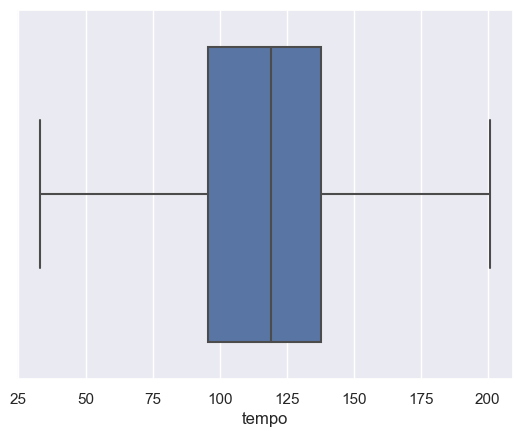

In [28]:
# What is the average value for each audio feature?
for feature in af:
    sns.boxplot(showfliers = False, x=Music_Data[feature])
    plt.show()

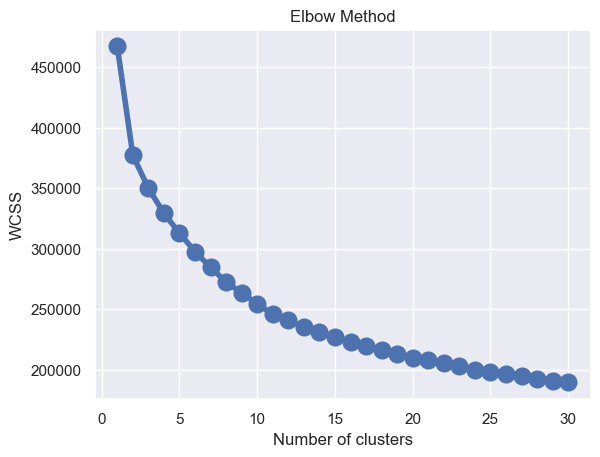

In [29]:
X = Music_Data.select_dtypes(np.number)
wcss = []
scaler = StandardScaler()
scaled_x = scaler.fit_transform(X)
for i in range(1, 31):
    kmeans = KMeans(n_clusters=i,random_state=0)
    kmeans.fit(scaled_x)
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 31), wcss ,linewidth=4, markersize=12,marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

## Therefore the number of clusters is 10

In [30]:
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = Music_Data.select_dtypes(np.number)
cluster_pipeline.fit(X)
Music_Data['cluster'] = cluster_pipeline.predict(X)

In [31]:
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
songs_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=songs_embedding)
projection['title'] = Music_Data['title']
projection['cluster'] = Music_Data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 33362 samples in 0.033s...
[t-SNE] Computed neighbors for 33362 samples in 15.493s...
[t-SNE] Computed conditional probabilities for sample 1000 / 33362
[t-SNE] Computed conditional probabilities for sample 2000 / 33362
[t-SNE] Computed conditional probabilities for sample 3000 / 33362
[t-SNE] Computed conditional probabilities for sample 4000 / 33362
[t-SNE] Computed conditional probabilities for sample 5000 / 33362
[t-SNE] Computed conditional probabilities for sample 6000 / 33362
[t-SNE] Computed conditional probabilities for sample 7000 / 33362
[t-SNE] Computed conditional probabilities for sample 8000 / 33362
[t-SNE] Computed conditional probabilities for sample 9000 / 33362
[t-SNE] Computed conditional probabilities for sample 10000 / 33362
[t-SNE] Computed conditional probabilities for sample 11000 / 33362
[t-SNE] Computed conditional probabilities for sample 12000 / 33362
[t-SNE] Computed conditional probabilities for sa

In [32]:
# 3d scatterplot using plotly
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=3, verbose=1))])
songs_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x','y','z'], data=songs_embedding)
projection['title'] = Music_Data['title']
projection['cluster'] = Music_Data['cluster']
Scene = dict(xaxis = dict(title  = 'X'),yaxis = dict(title  = 'Y'),zaxis = dict(title  = 'Z'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = kmeans.labels_
trace = go.Scatter3d(x=projection.iloc[:, 0], y=projection.iloc[:, 1], z=projection.iloc[:, 2], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 33362 samples in 0.030s...
[t-SNE] Computed neighbors for 33362 samples in 16.496s...
[t-SNE] Computed conditional probabilities for sample 1000 / 33362
[t-SNE] Computed conditional probabilities for sample 2000 / 33362
[t-SNE] Computed conditional probabilities for sample 3000 / 33362
[t-SNE] Computed conditional probabilities for sample 4000 / 33362
[t-SNE] Computed conditional probabilities for sample 5000 / 33362
[t-SNE] Computed conditional probabilities for sample 6000 / 33362
[t-SNE] Computed conditional probabilities for sample 7000 / 33362
[t-SNE] Computed conditional probabilities for sample 8000 / 33362
[t-SNE] Computed conditional probabilities for sample 9000 / 33362
[t-SNE] Computed conditional probabilities for sample 10000 / 33362
[t-SNE] Computed conditional probabilities for sample 11000 / 33362
[t-SNE] Computed conditional probabilities for sample 12000 / 33362
[t-SNE] Computed conditional probabilities for sa

In [33]:
class spotify_recommender():
    def __init__(self,dataset):
        self.dataset=dataset
    def recommend(self,songs,amount=1):
        distance=[]
        song = self.dataset[(self.dataset.title.str.lower() == songs.lower())].head (1).values[0] 
        rec= self.dataset[self.dataset.title.str.lower() != songs.lower()] 
        for songs in tqdm (rec.values):
            d = 0
            for col in np.arange(len(rec.columns)):
                if not col in [0,1,3,4,18]:
                    d = d + np.absolute (float (song [col]) - float (songs [col]))
            distance.append(d)
        rec['distance'] = distance
        rec = rec.sort_values('distance')
        columns = ['first_artist', 'title','release_date']
        return rec[columns] [: amount]

recommendations = spotify_recommender(Music_Data)

In [34]:
recommendations.recommend('shake it off',10)

100%|██████████████████████████████████| 33361/33361 [00:00<00:00, 37323.86it/s]


,first_artist,title,release_date
23479,Will Donato,The Goddess,2021
1407,The Modern Lovers,Roadrunner,1976
5358,Mos Def,Mathematics,1999
18756,Northlane,Crash & Burn,2019
3874,The Smashing Pumpkins,Rocket - 2011 Remaster,1993
24629,Ida Mae,My Girl is a Heartbreak (OurVinyl Sessions),2022
23102,Words of Niō,Cold Shoulder - Helsloot Remix,2021
5970,Vision Of Disorder,Living to Die,2001
10655,The Staves,Mexico,2011
17645,Claude Debussy,"Debussy: Preludes, Book 1, L. 117: II. Voiles",2018


In [38]:
import pickle
pickle.dump(Music_Data,open('songs.pkl','wb'))